<a href="https://colab.research.google.com/github/mastersigat/GeoPandas/blob/main/Seance2_Manipulation_donnees_spatiales.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Séance 2 / Manipulation et représentation de données spatiales avec GeoPandas

GeoPandas est une librairie open source pour faciliter le travail avec des données géospatiales en python. GeoPandas étend les types de données utilisés par les pandas pour permettre des opérations spatiales sur des types géométriques. Les opérations géométriques sont effectuées par shapely. Geopandas dépend en outre de fiona pour l'accès aux fichiers et de matplotlib pour le traçage. 

https://geopandas.org/en/stable/index.html

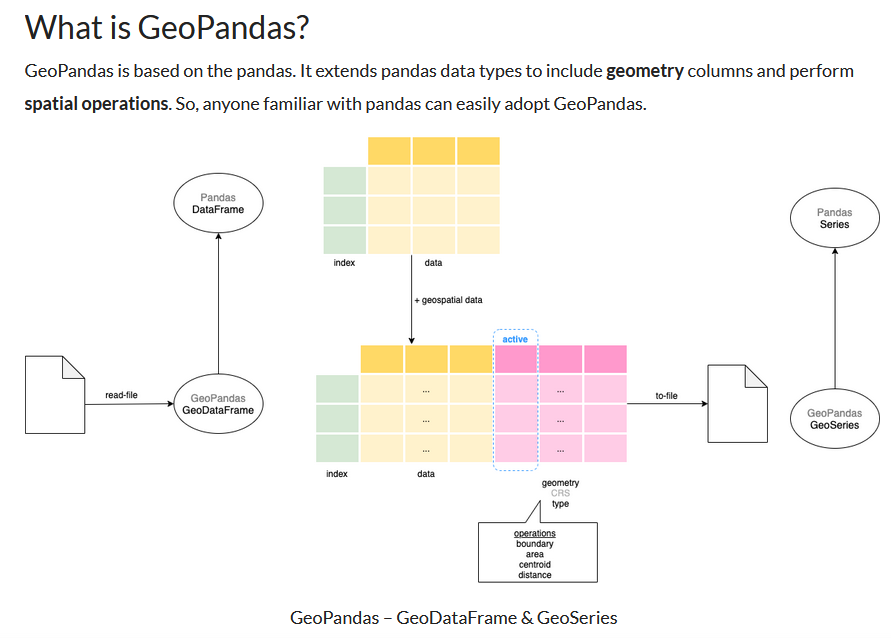

##Configuration de l'environnement de travail

In [ ]:
#Initialisation de l'environnement avec geopandas
!apt update
!apt install gdal-bin python-gdal python3-gdal 
# Install rtree - Geopandas requirment
!apt install python3-rtree 
# Install Geopandas
! pip install geopandas
# Instal MatplotLib
! pip install matplotlib
# Instal contextily
!pip install contextily
#Depuis sa version 0.8, Geopandas peut fonctionner de manière expérimental avec Pygeos ce qui accèlère certaines opérations
!pip install pygeos
# Pour la cartographie thématique
!pip install mapclassify
# Pour la cartographie interactive
!pip install folium

In [100]:
#Importation des librairies nécessaires

import pandas as pd #Gestion de données
import matplotlib.pyplot as plt #Visualisation de données
import geopandas as gpd #Gestion données spatiales
import contextily as ctx #Fonds de carte
import numpy as np #Manipulation de tableaux
import shapely #Manipulation de géométrie
import folium #Cartographie interactive
import mapclassify #Cartographie thématique

##Importer et préparer les données spatiales de la séance

In [ ]:
#Téléchargement des datas depuis le site opendata de Paris

!wget -O velib.geojson https://opendata.paris.fr/explore/dataset/velib-disponibilite-en-temps-reel/download/?format=geojson&timezone=Europe/Berlin&lang=fr
!wget -O IRIS.geojson https://data.iledefrance.fr/explore/dataset/iris/download/?format=geojson&refine.dep=75&timezone=Europe/Berlin&lang=fr 

### Importer la couche IRIS

Documentation import données SIG : https://geopandas.org/en/stable/docs/reference/api/geopandas.read_file.html

,nom_iris,insee_com,iris,typ_iris,code_iris,nom_com,dep,geometry
0,Val de Grace 7,75105,1907,H,751051907,Paris 5e Arrondissement,75,"POLYGON ((2.34364 48.84122, 2.34424 48.84245, ..."
1,Gros Caillou 7,75107,2807,H,751072807,Paris 7e Arrondissement,75,"POLYGON ((2.30090 48.85113, 2.29990 48.85173, ..."
2,Madeleine 3,75108,3103,A,751083103,Paris 8e Arrondissement,75,"POLYGON ((2.31961 48.87451, 2.31962 48.87449, ..."
3,Roquette 18,75111,4318,H,751114318,Paris 11e Arrondissement,75,"POLYGON ((2.38202 48.86019, 2.38281 48.85939, ..."
4,Folie Mericourt 14,75111,4114,H,751114114,Paris 11e Arrondissement,75,"POLYGON ((2.37303 48.87062, 2.37301 48.87041, ..."


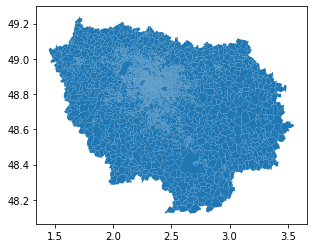

In [4]:
#Importer le couche des IRIS

IRIS= gpd.read_file("IRIS.geojson", encoding='utf-8')
IRIS.plot()
IRIS.head(5)

<AxesSubplot:>

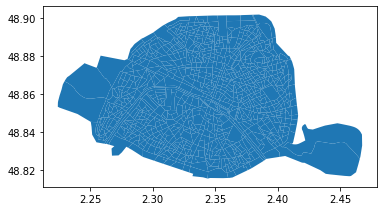

In [5]:
#Garder uniquement les IRIS de Paris

IRISPARIS = IRIS[(IRIS["dep"] == 75)]
IRISPARIS.plot()

In [6]:
#Checker les types des champs de la couche IRIS

IRISPARIS.dtypes

nom_iris       object
insee_com       int64
iris            int64
typ_iris       object
code_iris       int64
nom_com        object
dep             int64
geometry     geometry
dtype: object

<ipython-input-7-722176552134>:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  IRISPARIS.centroid.plot()


<AxesSubplot:>

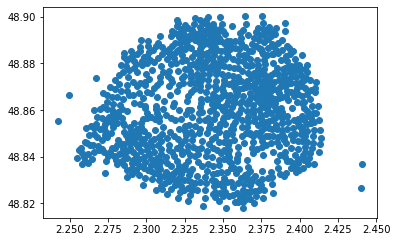

In [7]:
#Passer les polygones en centroides (à la volée)

IRISPARIS.centroid.plot()

<ipython-input-8-731de74f6657>:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  IRISPARIScentro.geometry = IRISPARIScentro['geometry'].centroid


<AxesSubplot:>

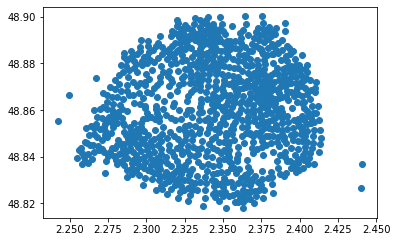

In [8]:
#Passer les polygones en centroides (comme une couche)

IRISPARIScentro = IRISPARIS.copy()
IRISPARIScentro.geometry = IRISPARIScentro['geometry'].centroid
IRISPARIScentro.plot()

<AxesSubplot:>

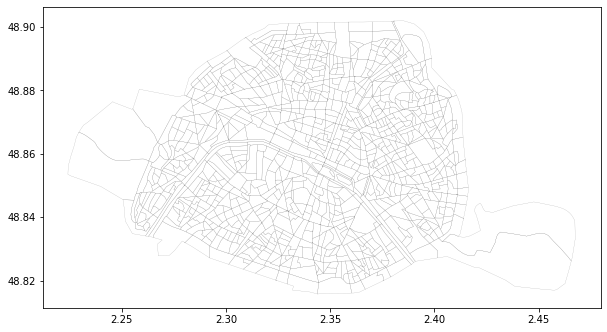

In [9]:
#Cartographier les IRIS en mode contours

IRISPARIS.boundary.plot(figsize=(10,10), linewidth=0.15, color = 'grey')

<AxesSubplot:>

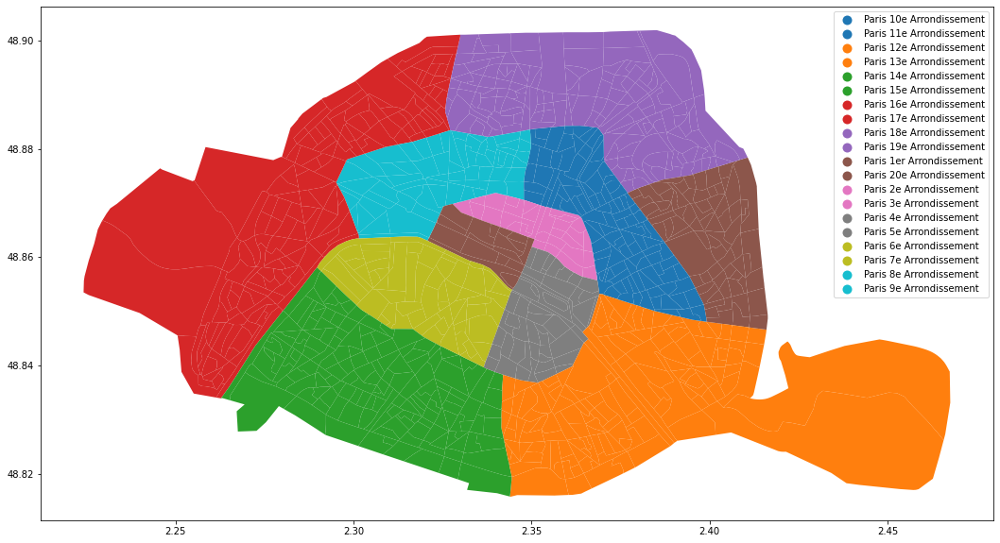

In [10]:
#Cartographier les IRIS en fonction de l'arrondissement

IRISPARIS.plot(column = "nom_com", linewidth=0.5, figsize=(20,10), legend=True)

In [11]:
# Faire une carte interactive avec la biliothèque Folium (https://python-visualization.github.io/folium/)

map = folium.Map(
    width='80%',height='50%',
    location=[48.863170000122665, 2.342566412818605],
    zoom_start=12,
    tiles="cartodbpositron")

IRIS = folium.GeoJson(IRISPARIS).add_to(map)

folium.GeoJsonTooltip(['nom_iris', 'nom_com']).add_to(IRIS)

map

In [12]:
# Exporter cette carte en HTML

map.save(outfile= "folium.html")

### La couche Vélibs

,name,stationcode,ebike,mechanical,duedate,numbikesavailable,numdocksavailable,capacity,is_renting,is_installed,nom_arrondissement_communes,is_returning,geometry
0,Toudouze - Clauzel,9020,4,1,2023-03-16 11:26:22+00:00,5,16,21,OUI,OUI,Paris,OUI,POINT (2.33736 48.87930)
1,Benjamin Godard - Victor Hugo,16107,4,4,2023-03-16 11:26:50+00:00,8,27,35,OUI,OUI,Paris,OUI,POINT (2.27572 48.86598)
2,Rouget de L'isle - Watteau,44015,0,0,2023-02-09 09:35:37+00:00,0,0,0,NON,NON,Vitry-sur-Seine,NON,POINT (2.39630 48.77819)
3,Mairie de Rosny-sous-Bois,31104,10,17,2023-03-16 11:26:39+00:00,27,2,30,OUI,OUI,Rosny-sous-Bois,OUI,POINT (2.48658 48.87126)
4,Cassini - Denfert-Rochereau,14111,8,4,2023-03-16 11:20:49+00:00,12,12,25,OUI,OUI,Paris,OUI,POINT (2.33604 48.83753)


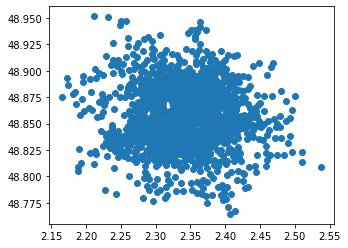

In [13]:
#Importer la couche des velibs

Velib= gpd.read_file("velib.geojson", encoding='utf-8')
Velib.plot()
Velib.head()

996

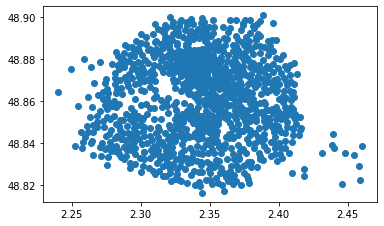

In [14]:
#Ne garder que les stations de Velibs de la ville de Paris (sélection par attribut)

VelibParis = Velib[(Velib["nom_arrondissement_communes"] == 'Paris')]
VelibParis.plot()
len(VelibParis)

In [15]:
# Ne garder que les champs intéressants et les renommer

VelibParis = VelibParis[["name", "stationcode", "ebike", "mechanical", "numbikesavailable", "numdocksavailable", "capacity", "geometry"]]
VelibParis = VelibParis.rename(columns={'name': 'Nom', 'stationcode':'Code', 'ebike': 'Veloselectriques', 'ebike': 'Veloselectriques', 'mechanical': 'Velosmecaniques', 'numbikesavailable': 'Velosdispo', 'numdocksavailable': 'Soclesdispo', 'capacity': 'Capacite'})
VelibParis.head()

,Nom,Code,Veloselectriques,Velosmecaniques,Velosdispo,Soclesdispo,Capacite,geometry
0,Toudouze - Clauzel,9020,4,1,5,16,21,POINT (2.33736 48.87930)
1,Benjamin Godard - Victor Hugo,16107,4,4,8,27,35,POINT (2.27572 48.86598)
4,Cassini - Denfert-Rochereau,14111,8,4,12,12,25,POINT (2.33604 48.83753)
5,Mairie du 12ème,12109,2,8,10,20,30,POINT (2.38755 48.84086)
7,Jourdan - Stade Charléty,14014,3,0,3,56,60,POINT (2.34334 48.81943)


###La couche des arrondissements (à importer via un fichier en local)

https://opendata.paris.fr/explore/dataset/arrondissements/export/?disjunctive.c_ar&disjunctive.c_arinsee&disjunctive.l_ar

,n_sq_ar,c_ar,c_arinsee,l_ar,l_aroff,n_sq_co,surface,perimetre,geom_x_y,geometry
0,750000018,18,75118,18ème Ardt,Buttes-Montmartre,750001537,5.996051e+06,9916.464176,"{'lon': 2.3481605195620405, 'lat': 48.89256926...","POLYGON ((2.36580 48.88554, 2.36469 48.88437, ..."
1,750000006,6,75106,6ème Ardt,Luxembourg,750001537,2.153096e+06,6483.686786,"{'lon': 2.3328979990533156, 'lat': 48.84913035...","POLYGON ((2.34459 48.85405, 2.34428 48.85375, ..."
2,750000012,12,75112,12ème Ardt,Reuilly,750001537,1.631478e+07,24089.666298,"{'lon': 2.4213249007846733, 'lat': 48.83497438...","POLYGON ((2.41388 48.83357, 2.41401 48.83357, ..."
3,750000013,13,75113,13ème Ardt,Gobelins,750001537,7.149311e+06,11546.546526,"{'lon': 2.362272440420904, 'lat': 48.828388031...","POLYGON ((2.37491 48.83801, 2.37698 48.83610, ..."
4,750000014,14,75114,14ème Ardt,Observatoire,750001537,5.614877e+06,10317.483310,"{'lon': 2.3265420441989484, 'lat': 48.82924450...","POLYGON ((2.33381 48.84061, 2.33673 48.83965, ..."


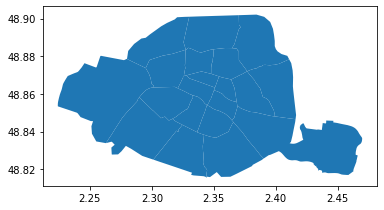

In [17]:
#Importer le jeu de données dans l'espace de travail puis le convertir en gdf

Ardt= gpd.read_file("arrondissements.geojson", encoding='utf-8')
Ardt.plot()
Ardt.head()

## Ecrire un jeu de données spatiales

Documentation export données spatiales : https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.to_file.html

In [ ]:
#Ecrire un geojson

VelibParis.to_file("Velibs.geojson", driver="GeoJSON")

In [ ]:
#Ecrire un shapefile

VelibParis.to_file("Velibs.shp")

<ipython-input-18-1012faa465e0>:3: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  VelibParis.to_file("Velibs.shp")


In [ ]:
#Ecrire un gpk

IRISPARIS.to_file("Paris.gpkg", layer='IRIS', driver="GPKG")
VelibParis.to_file("Paris.gpkg", layer='VelibParis', driver="GPKG")

## Calculer des statistique basiques (descriptives)

In [18]:
#Calculer des statistiques basiques pour tous les champs de la couche des vélibs

VelibParis.describe()

,Veloselectriques,Velosmecaniques,Velosdispo,Soclesdispo,Capacite
count,996.000000,996.000000,996.000000,996.000000,996.000000
mean,4.529116,7.204819,11.733936,19.206827,32.151606
std,5.492083,10.104092,13.347406,13.722058,12.858804
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,2.000000,8.000000,23.000000
50%,2.000000,2.000000,6.000000,18.000000,30.000000
75%,6.000000,11.000000,19.000000,29.000000,39.000000
max,43.000000,60.000000,77.000000,67.000000,74.000000


In [19]:
# Calculer le nombre de stations de vélibs

VelibParis["Code"].size

996

In [20]:
# Calculer la somme totale des capacités

VelibParis["Capacite"].sum()

32023

In [21]:
# Calculer la moyenne des capacités

VelibParis["Capacite"].mean()

32.15160642570281

In [22]:
#Calculer le nombre total de vélibs, le nombre total vélibs électrique et le nombre total de vélibs mécaniques
A=VelibParis['Velosdispo'].sum()
B=VelibParis['Velosmecaniques'].sum()
C=VelibParis['Veloselectriques'].sum()

print(A,B,C)

11687 7176 4511


In [23]:
# Créer une fonction pour sortir un indicateur formaté et compréhensible

Txveloelec = (VelibParis['Veloselectriques'].sum())/ (VelibParis['Velosdispo'].sum()) *100
Txveloelec = round(Txveloelec,1)
print ("Taux de vélos électriques " + str(Txveloelec) + "%")

Taux de vélos électriques 38.6%


In [24]:
# Ajouter une colonne avec le tx d'occupation de chaque stations

VelibParis["Txoccupation"] = VelibParis["Soclesdispo"] / VelibParis["Capacite"] *100
VelibParis.head()

,Nom,Code,Veloselectriques,Velosmecaniques,Velosdispo,Soclesdispo,Capacite,geometry,Txoccupation
0,Toudouze - Clauzel,9020,4,1,5,16,21,POINT (2.33736 48.87930),76.190476
1,Benjamin Godard - Victor Hugo,16107,4,4,8,27,35,POINT (2.27572 48.86598),77.142857
4,Cassini - Denfert-Rochereau,14111,8,4,12,12,25,POINT (2.33604 48.83753),48.000000
5,Mairie du 12ème,12109,2,8,10,20,30,POINT (2.38755 48.84086),66.666667
7,Jourdan - Stade Charléty,14014,3,0,3,56,60,POINT (2.34334 48.81943),93.333333


## Cartographie thématique

* Couleurs de ColorBrewer > https://www.datanovia.com/en/wp-content/uploads/dn-tutorials/ggplot2/figures/101-rcolorbrewer-palette-rcolorbrewer-palettes-1.png 

* Inverser palette de couleur : _r

* Documentation carto thématique : https://geopandas.org/en/stable/gallery/choropleths.html

<AxesSubplot:>

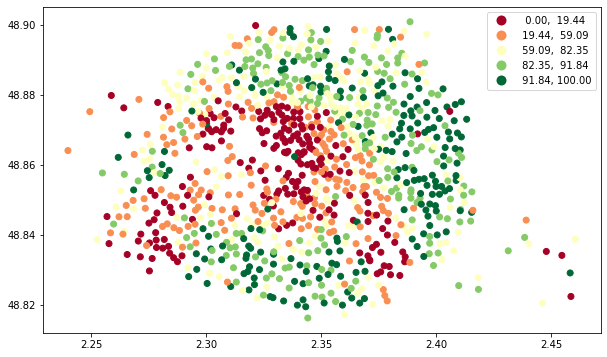

In [106]:
#Cartographier le taux d'occupation par station (de couleurs)

VelibParis.plot(figsize=(10,10), alpha=1, column="Txoccupation", cmap='RdYlGn',scheme='quantiles', categorical=False, legend=True)

<AxesSubplot:>

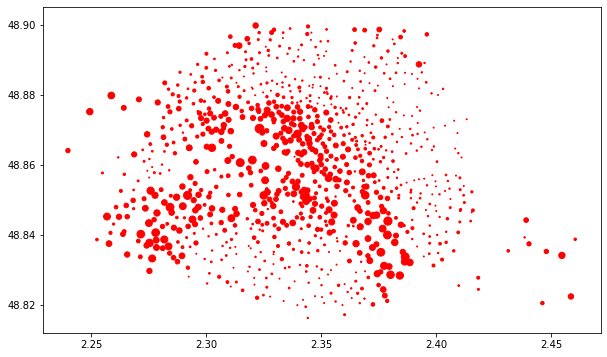

In [26]:
#Cartographier le nombre de vélibs disponibles par station (variation de tailles)

VelibParis.plot(figsize=(10,10), markersize="Velosdispo",alpha=1, color = 'red', categorical=False, legend=True)

<AxesSubplot:>

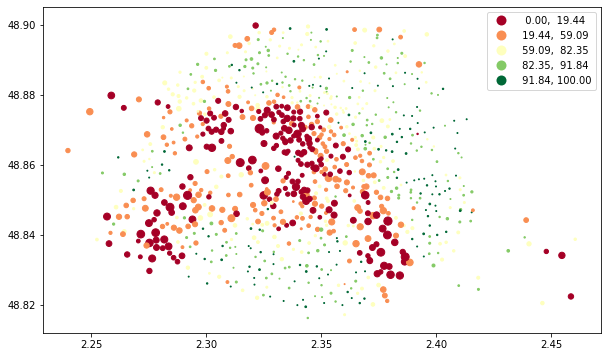

In [27]:
#Cartographier le nombre de vélibs disponibles et le taux d'occupation par station (variation de tailles et de couleurs)

VelibParis.plot(figsize=(10,10), markersize="Velosdispo",alpha=1, column="Txoccupation", cmap='RdYlGn',scheme='quantiles', categorical=False, legend=True)

#### Ajouter un fond de carte (Librairie Contextily)

https://contextily.readthedocs.io/en/latest/intro_guide.html

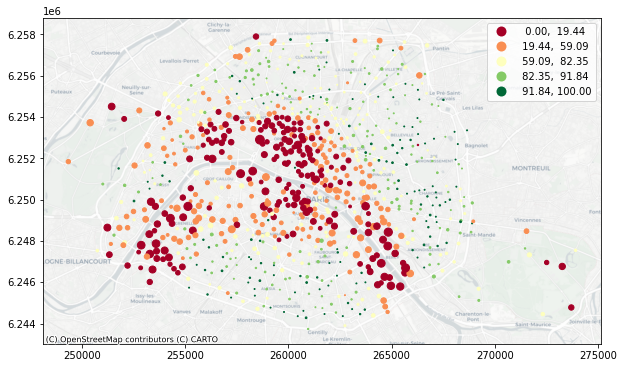

In [28]:
#Cartographier le nombre de vélibs disponibles et le taux d'occupation par station avec un fond de carte CartoDB

ax = VelibParis.to_crs('EPSG:3857').plot(figsize=(10,10),markersize="Velosdispo",alpha=1, column="Txoccupation", cmap='RdYlGn',scheme='quantiles', categorical=False, legend=True)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)


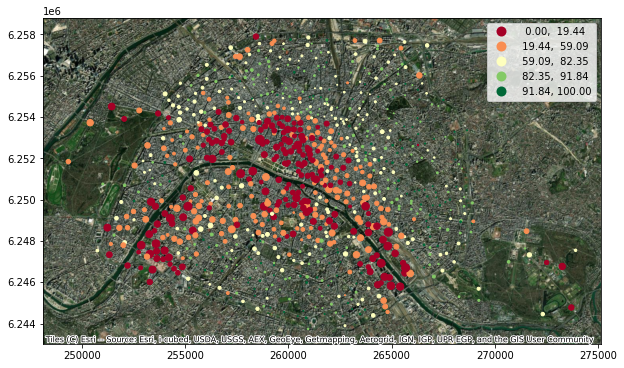

In [107]:
#Cartographier le nombre de vélibs disponibles et le taux d'occupation par station avec un fond de carte Esri et une légende sympa

ax = VelibParis.to_crs('EPSG:3857').plot(figsize=(10,10),markersize="Velosdispo",alpha=1, column="Txoccupation", cmap='RdYlGn',scheme='quantiles', categorical=False, legend=True)
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery )

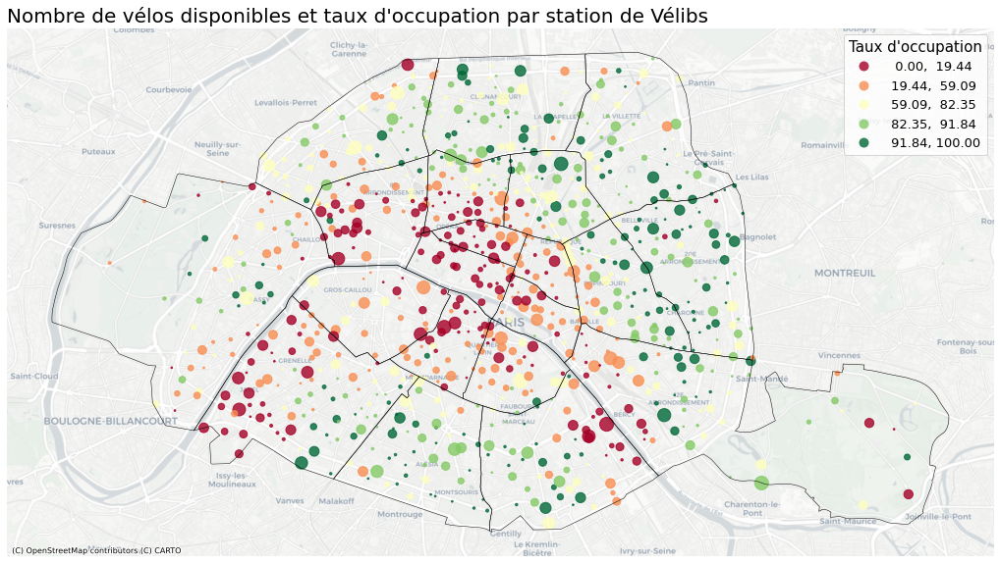

In [109]:
#Faire une carte finalisée avec deux couches 

Carte1, ax = plt.subplots(figsize=(18,18))
Ardt.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.5, color = 'black')
VelibParis.to_crs('EPSG:3857').plot(ax=ax, markersize=VelibParis['Velosdispo']*3,column="Txoccupation", cmap='RdYlGn',scheme='quantiles', alpha=0.8, categorical=False,
                                    legend=True, legend_kwds={'title': "Taux d'occupation", 'loc': 'upper right', 'title_fontsize':15, 'fontsize':13})
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.title("Nombre de vélos disponibles et taux d'occupation par station de Vélibs", loc='left', fontsize=20)
plt.show()

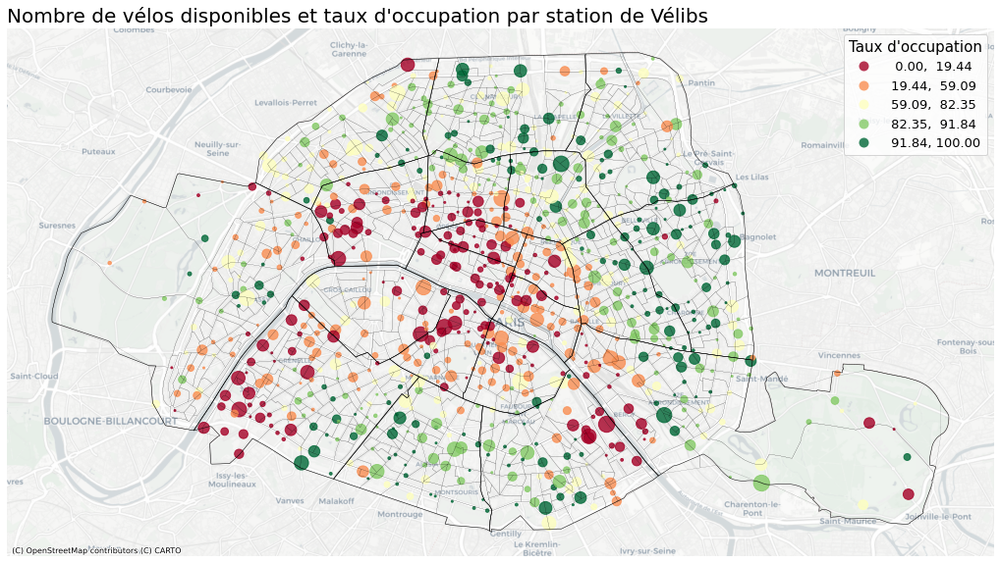

In [110]:
#Faire une carte finalisée avec trois couches

Carte1, ax = plt.subplots(figsize=(18,18))
Ardt.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.5, color = 'black')
IRISPARIS.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.1, color = 'black')
VelibParis.to_crs('EPSG:3857').plot(ax=ax, markersize=VelibParis['Velosdispo']*4,column="Txoccupation", cmap='RdYlGn',scheme='quantiles', alpha=0.8, categorical=False,
                                    legend=True, legend_kwds={'title': "Taux d'occupation", 'loc': 'upper right', 'title_fontsize':15, 'fontsize':13})
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.title("Nombre de vélos disponibles et taux d'occupation par station de Vélibs", loc='left', fontsize=20)
plt.show()

In [ ]:
# Enreigistrer une carte en image

Carte1.savefig("Carte1.png")

## Exercices sur la couche Mobilib'

dataset : https://opendata.paris.fr/explore/dataset/liste-des-stations-de-services-de-vehicules

* Carte des stations avec nb d'emplacements (taille) et opérateur (couleur)
* Graphique du nombre de stations par opérateur 

## Jointure attributaire, calcul d'indicateurs, cartographie thématique

In [ ]:
#Téléchargement des datas depuis l'opendata (https://opendata.apur.org/datasets/recensement-iris-population/geoservice)
!wget -O population.csv https://opendata.arcgis.com/datasets/b2936d51b66b4213ae9351657fa230ac_0.csv?outSR=%7B%22latestWkid%22%3A2154%2C%22wkid%22%3A102110%7D


In [35]:
#Importer CSV to dataframe

population = pd.read_csv("population.csv", sep=',')
population.head(3)

,OBJECTID,n_sq_ir,c_cainsee,n_qu,c_ir,c_typeir,l_ir,m2_ip,m2_pop,m2_emp,...,pct_evo_etranger,nb_immigre,pct_immigre,nb_immigre_n5,pct_immigre_n5,pct_evo_immigre,n_sq_epci,l_epci,shape_Length,shape_Area
0,1,930003891,93048,0.0,930480801,H,Bel Air Grands Pêchers 1,115523.688783,106227.518051,114780.364397,...,0.291606,1060.159129,34.679246,1108.278961,34.445992,0.233254,140,T8 Est Ensemble,1927.186327,139705.062882
1,2,930003875,93048,0.0,930480803,H,Bel Air Grands Pechers 3,88014.547679,80896.936435,81518.540816,...,3.577858,650.452747,31.879210,555.138345,28.404448,3.474762,140,T8 Est Ensemble,1597.143066,106750.396820
2,3,930003874,93048,0.0,930480901,H,Ramenas Fabien Lagrange 1,158411.119470,138753.241185,149619.390800,...,6.790857,617.079310,31.591452,542.698413,25.769168,5.822284,140,T8 Est Ensemble,2494.946453,209582.967651


In [36]:
# Ne garder que les colonne importantes

PopulationOK = population[["c_ir", "l_ir", "nb_pop"]]
PopulationOK.head()

,c_ir,l_ir,nb_pop
0,930480801,Bel Air Grands Pêchers 1,3057.042017
1,930480803,Bel Air Grands Pechers 3,2040.366599
2,930480901,Ramenas Fabien Lagrange 1,1953.311022
3,930480903,Ramenas Fabien Lagrange 3,2538.624479
4,930481002,Branly Boissiere 2,1750.317596


In [37]:
#Renommer les colonnes

PopulationOK = PopulationOK.rename(columns={'c_ir': 'Code_IRIS', 'l_ir':'Libelle', 'nb_pop': 'Population'})
PopulationOK.head()

,Code_IRIS,Libelle,Population
0,930480801,Bel Air Grands Pêchers 1,3057.042017
1,930480803,Bel Air Grands Pechers 3,2040.366599
2,930480901,Ramenas Fabien Lagrange 1,1953.311022
3,930480903,Ramenas Fabien Lagrange 3,2538.624479
4,930481002,Branly Boissiere 2,1750.317596


In [38]:
# Faire la jointure attributaire

IRISPARIS = IRISPARIS.merge(PopulationOK, left_on='code_iris', right_on='Code_IRIS')
IRISPARIS.head()

,nom_iris,insee_com,iris,typ_iris,code_iris,nom_com,dep,geometry,Code_IRIS,Libelle,Population
0,Val de Grace 7,75105,1907,H,751051907,Paris 5e Arrondissement,75,"POLYGON ((2.34364 48.84122, 2.34424 48.84245, ...",751051907,Val-de-Grace 7,2394.194331
1,Gros Caillou 7,75107,2807,H,751072807,Paris 7e Arrondissement,75,"POLYGON ((2.30090 48.85113, 2.29990 48.85173, ...",751072807,Gros Caillou 7,2257.124076
2,Madeleine 3,75108,3103,A,751083103,Paris 8e Arrondissement,75,"POLYGON ((2.31961 48.87451, 2.31962 48.87449, ...",751083103,Madeleine 3,1089.533803
3,Roquette 18,75111,4318,H,751114318,Paris 11e Arrondissement,75,"POLYGON ((2.38202 48.86019, 2.38281 48.85939, ...",751114318,Roquette 18,2197.653733
4,Folie Mericourt 14,75111,4114,H,751114114,Paris 11e Arrondissement,75,"POLYGON ((2.37303 48.87062, 2.37301 48.87041, ...",751114114,Folie Mericourt 14,1706.345042


In [ ]:
# Reprojeter la couche IRIS pour le calcul de surface

IRIS2154 = IRISPARIS.to_crs(2154)
IRIS2154.crs

In [40]:
# Ajouter une colonne Surface à la couche des IRIS

IRIS2154["surface"] = IRIS2154['geometry'].area/1000000
IRIS2154.head(10) 

,nom_iris,insee_com,iris,typ_iris,code_iris,nom_com,dep,geometry,Code_IRIS,Libelle,Population,surface
0,Val de Grace 7,75105,1907,H,751051907,Paris 5e Arrondissement,75,"POLYGON ((651827.000 6860330.000, 651871.600 6...",751051907,Val-de-Grace 7,2394.194331,0.122526
1,Gros Caillou 7,75107,2807,H,751072807,Paris 7e Arrondissement,75,"POLYGON ((648699.720 6861458.710, 648626.610 6...",751072807,Gros Caillou 7,2257.124076,0.123771
2,Madeleine 3,75108,3103,A,751083103,Paris 8e Arrondissement,75,"POLYGON ((650095.100 6864047.000, 650096.000 6...",751083103,Madeleine 3,1089.533803,0.079612
3,Roquette 18,75111,4318,H,751114318,Paris 11e Arrondissement,75,"POLYGON ((654660.400 6862417.100, 654717.000 6...",751114318,Roquette 18,2197.653733,0.050855
4,Folie Mericourt 14,75111,4114,H,751114114,Paris 11e Arrondissement,75,"POLYGON ((654009.750 6863582.110, 654007.750 6...",751114114,Folie Mericourt 14,1706.345042,0.035169
5,Maison Blanche 3,75113,5103,H,751135103,Paris 13e Arrondissement,75,"POLYGON ((653157.000 6857882.000, 653092.000 6...",751135103,Maison Blanche 3,2599.215028,0.058901
6,Tuileries,75101,105,D,751010105,Paris 1er Arrondissement,75,"POLYGON ((650999.100 6862844.800, 650983.100 6...",751010105,Tuileries,0.000000,0.247627
7,Vivienne 1,75102,601,H,751020601,Paris 2e Arrondissement,75,"POLYGON ((651298.400 6863179.800, 651280.900 6...",751020601,Vivienne 1,1669.175559,0.123474
8,Saint-Gervais 2,75104,1402,H,751041402,Paris 4e Arrondissement,75,"POLYGON ((652594.000 6862064.900, 652621.000 6...",751041402,Saint-Gervais 2,2173.956963,0.078941
9,Champs Elysees 3,75108,2903,A,751082903,Paris 8e Arrondissement,75,"POLYGON ((648788.000 6863621.000, 648826.000 6...",751082903,Champs Elysées 3,536.556750,0.134344


In [41]:
#Calculer la densité de population des IRIS

IRIS2154["Densite"] = IRIS2154["Population"] / IRIS2154["surface"]
IRIS2154.head()

,nom_iris,insee_com,iris,typ_iris,code_iris,nom_com,dep,geometry,Code_IRIS,Libelle,Population,surface,Densite
0,Val de Grace 7,75105,1907,H,751051907,Paris 5e Arrondissement,75,"POLYGON ((651827.000 6860330.000, 651871.600 6...",751051907,Val-de-Grace 7,2394.194331,0.122526,19540.231046
1,Gros Caillou 7,75107,2807,H,751072807,Paris 7e Arrondissement,75,"POLYGON ((648699.720 6861458.710, 648626.610 6...",751072807,Gros Caillou 7,2257.124076,0.123771,18236.237401
2,Madeleine 3,75108,3103,A,751083103,Paris 8e Arrondissement,75,"POLYGON ((650095.100 6864047.000, 650096.000 6...",751083103,Madeleine 3,1089.533803,0.079612,13685.554321
3,Roquette 18,75111,4318,H,751114318,Paris 11e Arrondissement,75,"POLYGON ((654660.400 6862417.100, 654717.000 6...",751114318,Roquette 18,2197.653733,0.050855,43214.172803
4,Folie Mericourt 14,75111,4114,H,751114114,Paris 11e Arrondissement,75,"POLYGON ((654009.750 6863582.110, 654007.750 6...",751114114,Folie Mericourt 14,1706.345042,0.035169,48518.853703


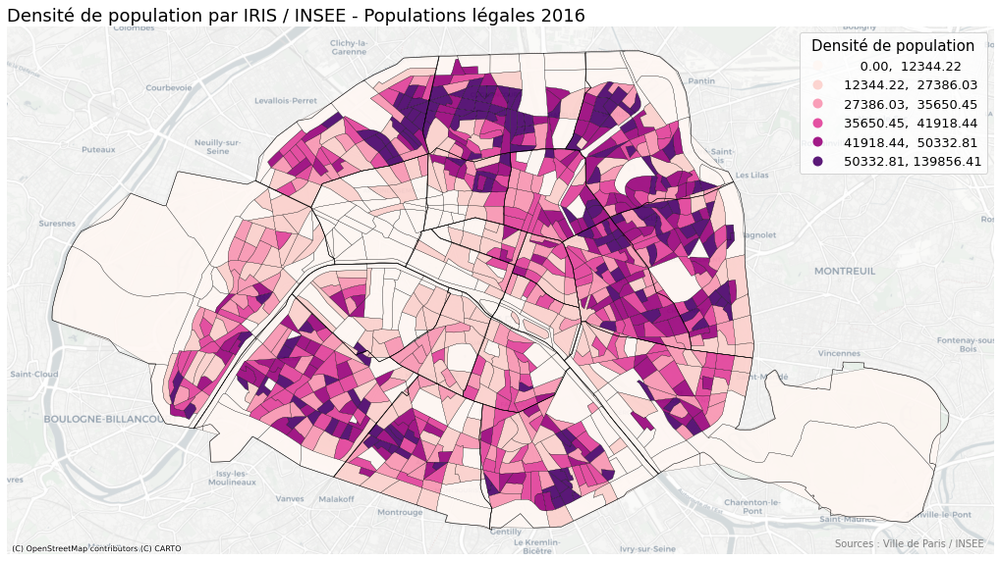

In [111]:
#Faire une carte finalisée des densités de population par IRIS

Carte2, ax = plt.subplots(figsize=(18,18))
Ardt.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.5, color = 'black')
IRISPARIS.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.2, color = 'black')
IRIS2154.to_crs('EPSG:3857').plot(ax=ax, k=6, column='Densite', cmap='RdPu',scheme='quantiles', alpha= 0.9,  
                                  legend=True, legend_kwds={'title': "Densité de population", 'loc': 'upper right', 'title_fontsize':15, 'fontsize':13})
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
ax.axis("off")
ax.text(0.99, 0.01, 'Sources : Ville de Paris / INSEE', verticalalignment='bottom', horizontalalignment='right',
        transform=ax.transAxes, color='grey', fontsize=10)
plt.title('Densité de population par IRIS / INSEE - Populations légales 2016', loc='left', fontsize=18)
plt.show()

In [124]:
# Faire une carte interactive avec la biliothèque Folium (https://python-visualization.github.io/folium/)

IRISfolium = pd.DataFrame(IRIS2154)

webmap = folium.Map(
    location=[48.863170000122665, 2.342566412818605],
    zoom_start=13,
    tiles="cartodbpositron")

map = folium.Choropleth(
    geo_data=IRIS2154,
    data=IRISfolium,
    name="choropleth",
    columns=["iris", "Densite"],
    key_on="feature.properties.iris",
    fill_color="YlOrRd",
    fill_opacity=0.9,
    line_opacity=0.2,
    legend_name="Densité de population (habitants/km2)",
).add_to(webmap)

map.geojson.add_child(
    folium.features.GeoJsonTooltip(['nom_iris', 'Population', 'Densite'], labels=False)
)

webmap

## Dissolve(With Stat)

,geometry,nom_iris,insee_com,iris,typ_iris,code_iris,dep,Code_IRIS,Libelle,Population
nom_com,,,,,,,,,,
Paris 10e Arrondissement,"POLYGON ((2.35411 48.86928, 2.35282 48.86955, ...",Saint-Vincent de Paul 11,75110,3711,A,751103711,75,751103711,Saint-Vincent de Paul 11,168.476846
Paris 11e Arrondissement,"POLYGON ((2.37163 48.85278, 2.37059 48.85300, ...",Roquette 18,75111,4318,H,751114318,75,751114318,Roquette 18,2197.653733
Paris 12e Arrondissement,"POLYGON ((2.38978 48.82592, 2.38889 48.82660, ...",Picpus 4,75112,4604,H,751124604,75,751124604,Picpus 4,2629.000906
Paris 13e Arrondissement,"POLYGON ((2.35844 48.81601, 2.35747 48.81599, ...",Maison Blanche 3,75113,5103,H,751135103,75,751135103,Maison Blanche 3,2599.215028
Paris 14e Arrondissement,"POLYGON ((2.31802 48.82144, 2.31673 48.82172, ...",Montparnasse 6,75114,5306,H,751145306,75,751145306,Montparnasse 6,2011.495479


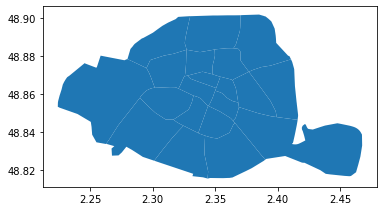

In [54]:
# Créer une couche des arrondissements en regroupant selon la variable nom_com

ARDT = IRISPARIS.dissolve(by='nom_com')
ARDT.plot()
ARDT.head()

In [55]:
# Créer une couche des arrondissements avec une agrégation statistiques (Population)

ARDT = IRIS2154.dissolve(by='insee_com', aggfunc='sum')
ARDT.head()


,geometry,iris,code_iris,dep,Code_IRIS,Population,surface,Densite
insee_com,,,,,,,,
75101,"POLYGON ((652081.290 6862048.180, 652038.370 6...",3644,12767173644,1275,12767173644,16545.0,1.827486,196419.344299
75102,"POLYGON ((651674.870 6863044.640, 651580.760 6...",9534,10514289534,1050,10514289534,20796.0,0.994136,328710.884634
75103,"POLYGON ((652508.700 6862567.660, 652413.950 6...",17745,12767527745,1275,12767527745,35049.0,1.171823,557159.554395
75104,"POLYGON ((653050.930 6861120.690, 652966.350 6...",30725,15771870725,1575,15771870725,27146.0,1.619944,359457.988367
75105,"POLYGON ((651897.060 6859945.570, 651801.780 6...",57514,23282607514,2325,23282607514,59333.0,2.516924,834564.296242


In [58]:
# Vérifier la population dans les IRIS (niveau de départ) et dans les arrondissements (résultat de l'aggrégation spatiale)

A= IRISPARIS["Population"].sum()
B= ARDT["Population"].sum()

print ("Population IRIS = " + str(A) + "\nPopulation Arrondissements = " + str(B) ) # \n permet de sauter une ligne lors de l'impression d'une chaîne de caractères en Python

Population IRIS = 2206488.0
Population Arrondissements = 2206488.0



## Exercice avec les données de logement des IRIS

https://opendata.apur.org/datasets/recensement-iris-logement/data


* Produire une carte avec en cercle proportionnels le nombre de logement sociaux 
* Produire une carte avec en aplat de couleur le taux de logement vacant



In [ ]:
#Téléchargement des datas depuis l'opendata (https://opendata.apur.org/datasets/recensement-iris-population/geoservice)
!wget -O logement.csv https://opendata.arcgis.com/datasets/a57b54a5ae1046068a203d13d744343b_2.csv?outSR=%7B%22latestWkid%22%3A2154%2C%22wkid%22%3A102110%7D

In [60]:
#Importer CSV to dataframe

logement = pd.read_csv("logement.csv", sep=',')
logement.head(3)

,OBJECTID,n_sq_ir,c_cainsee,n_qu,c_ir,c_typeir,l_ir,m2_ip,m2_pop,m2_emp,...,evo_pct_rp_5pp,nb_men_voit,pct_men_voit,nb_men_voit_n5,pct_men_voit_n5,evo_pct_men_voit,n_sq_epci,l_epci,shape_Length,shape_Area
0,1,930003891,93048,0.0,930480801,H,Bel Air Grands Pêchers 1,115523.688783,106227.518051,114780.364397,...,4.595114,674.180839,58.481746,716.254373,61.071292,-2.589546,140.0,T8 Est Ensemble,1927.186327,139705.062882
1,2,930003875,93048,0.0,930480803,H,Bel Air Grands Pechers 3,88014.547679,80896.936435,81518.540816,...,3.845138,437.745301,54.807347,374.788998,51.381302,3.426045,140.0,T8 Est Ensemble,1597.143066,106750.396820
2,3,930003874,93048,0.0,930480901,H,Ramenas Fabien Lagrange 1,158411.119470,138753.241185,149619.390800,...,-4.477577,514.408272,56.398130,513.187423,58.559052,-2.160922,140.0,T8 Est Ensemble,2494.946453,209582.967651


In [61]:
# Ne garder que les colonne importantes

LogementOK = logement[["c_ir", "l_ir", "nb_log", "nb_logvac", "nb_loc_social"]]
LogementOK.head()

,c_ir,l_ir,nb_log,nb_logvac,nb_loc_social
0,930480801,Bel Air Grands Pêchers 1,1215.000069,42.734671,382.744007
1,930480803,Bel Air Grands Pechers 3,827.500048,27.783878,548.040149
2,930480901,Ramenas Fabien Lagrange 1,1007.500054,83.311007,135.500873
3,930480903,Ramenas Fabien Lagrange 3,1174.500064,104.873548,349.870857
4,930481002,Branly Boissiere 2,713.000038,50.006217,139.873760


In [62]:
# Faire la jointure attributaire

IRISPARIS = IRISPARIS.merge(LogementOK, left_on='code_iris', right_on='c_ir')
IRISPARIS.head(2)

,nom_iris,insee_com,iris,typ_iris,code_iris,nom_com,dep,geometry,Code_IRIS,Libelle,Population,c_ir,l_ir,nb_log,nb_logvac,nb_loc_social
0,Val de Grace 7,75105,1907,H,751051907,Paris 5e Arrondissement,75,"POLYGON ((2.34364 48.84122, 2.34424 48.84245, ...",751051907,Val-de-Grace 7,2394.194331,751051907,Val-de-Grace 7,1325.507235,98.032090,89.589028
1,Gros Caillou 7,75107,2807,H,751072807,Paris 7e Arrondissement,75,"POLYGON ((2.30090 48.85113, 2.29990 48.85173, ...",751072807,Gros Caillou 7,2257.124076,751072807,Gros Caillou 7,1289.498225,53.253745,3.273282


In [63]:
#Calculer le taux de logements vacant

IRISPARIS["txlogvac"] = IRISPARIS["nb_logvac"] / IRISPARIS["nb_log"] *100
IRISPARIS.head()

,nom_iris,insee_com,iris,typ_iris,code_iris,nom_com,dep,geometry,Code_IRIS,Libelle,Population,c_ir,l_ir,nb_log,nb_logvac,nb_loc_social,txlogvac
0,Val de Grace 7,75105,1907,H,751051907,Paris 5e Arrondissement,75,"POLYGON ((2.34364 48.84122, 2.34424 48.84245, ...",751051907,Val-de-Grace 7,2394.194331,751051907,Val-de-Grace 7,1325.507235,98.032090,89.589028,7.395817
1,Gros Caillou 7,75107,2807,H,751072807,Paris 7e Arrondissement,75,"POLYGON ((2.30090 48.85113, 2.29990 48.85173, ...",751072807,Gros Caillou 7,2257.124076,751072807,Gros Caillou 7,1289.498225,53.253745,3.273282,4.129804
2,Madeleine 3,75108,3103,A,751083103,Paris 8e Arrondissement,75,"POLYGON ((2.31961 48.87451, 2.31962 48.87449, ...",751083103,Madeleine 3,1089.533803,751083103,Madeleine 3,674.212770,86.884528,42.172518,12.886811
3,Roquette 18,75111,4318,H,751114318,Paris 11e Arrondissement,75,"POLYGON ((2.38202 48.86019, 2.38281 48.85939, ...",751114318,Roquette 18,2197.653733,751114318,Roquette 18,1654.497143,118.252164,10.132180,7.147318
4,Folie Mericourt 14,75111,4114,H,751114114,Paris 11e Arrondissement,75,"POLYGON ((2.37303 48.87062, 2.37301 48.87041, ...",751114114,Folie Mericourt 14,1706.345042,751114114,Folie Mericourt 14,1232.497955,172.140363,0.000000,13.966787


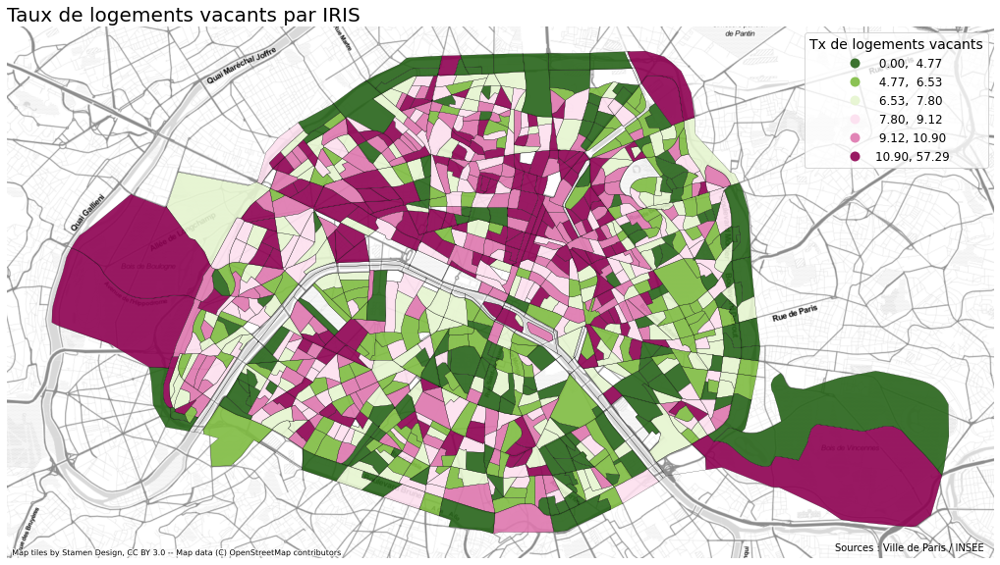

In [112]:
#Faire une carte du taux de logements vacants par IRIS

Carte4, ax = plt.subplots(figsize=(18,16))
IRISPARIS.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.2, color = 'black')
IRISPARIS.to_crs('EPSG:3857').plot(ax=ax, k=6, column='txlogvac', cmap='PiYG_r',scheme='quantiles', alpha=0.9, 
                                    legend=True, legend_kwds={'title': "Tx de logements vacants", 'loc': 'upper right', 'title_fontsize':14, 'fontsize':12})
ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)
ax.axis("off")
plt.title('Taux de logements vacants par IRIS', loc='left', fontsize=20)
ax.text(0.99, 0.01, 'Sources : Ville de Paris / INSEE', verticalalignment='bottom', horizontalalignment='right',
        transform=ax.transAxes, color='black', fontsize=10)
plt.show()

In [66]:
# Calculer le taux de logements sociaux par IRIS

IRISPARIS['Txlogsocial'] = IRISPARIS["nb_loc_social"] / IRISPARIS["nb_log"] *100 
IRISPARIS.head(2)

,nom_iris,insee_com,iris,typ_iris,code_iris,nom_com,dep,geometry,Code_IRIS,Libelle,Population,c_ir,l_ir,nb_log,nb_logvac,nb_loc_social,txlogvac,Txlogsocial
0,Val de Grace 7,75105,1907,H,751051907,Paris 5e Arrondissement,75,"POLYGON ((2.34364 48.84122, 2.34424 48.84245, ...",751051907,Val-de-Grace 7,2394.194331,751051907,Val-de-Grace 7,1325.507235,98.032090,89.589028,7.395817,6.758849
1,Gros Caillou 7,75107,2807,H,751072807,Paris 7e Arrondissement,75,"POLYGON ((2.30090 48.85113, 2.29990 48.85173, ...",751072807,Gros Caillou 7,2257.124076,751072807,Gros Caillou 7,1289.498225,53.253745,3.273282,4.129804,0.253842


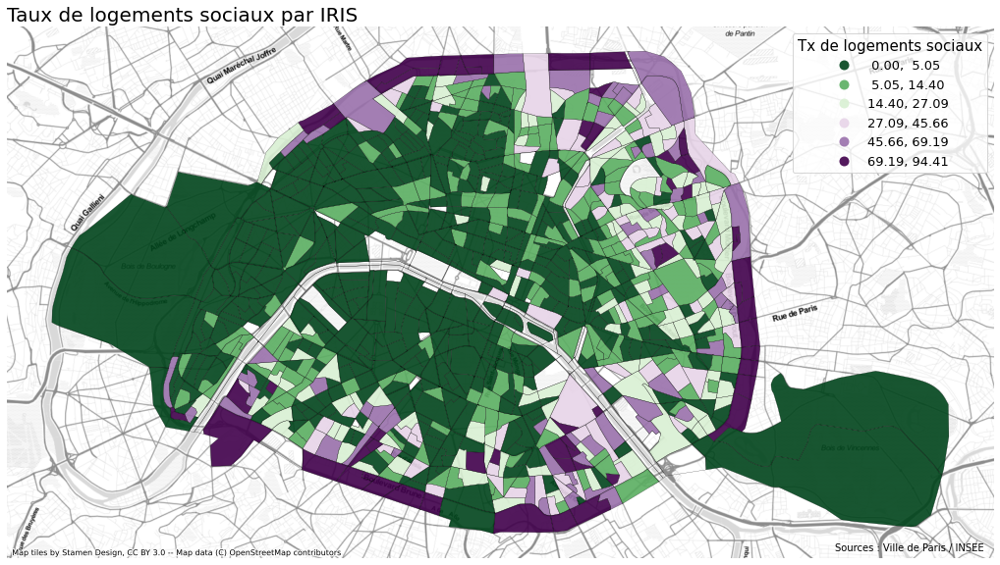

In [113]:
#Faire une carte du taux de logements sociaux par IRIS

Carte4, ax = plt.subplots(figsize=(18,16))
IRISPARIS.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.2, color = 'black')
IRISPARIS.to_crs('EPSG:3857').plot(ax=ax, k=6, column='Txlogsocial', cmap='PRGn_r',scheme='natural_breaks', alpha=0.9, 
                                  legend=True, legend_kwds={'title': "Tx de logements sociaux", 'loc': 'upper right', 'title_fontsize':15, 'fontsize':13})
ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)
ax.axis("off")
plt.title('Taux de logements sociaux par IRIS', loc='left', fontsize=20)
ax.text(0.99, 0.01, 'Sources : Ville de Paris / INSEE', verticalalignment='bottom', horizontalalignment='right',
        transform=ax.transAxes, color='black', fontsize=10)
plt.show()

<ipython-input-121-59fca32eb57c>:6: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  IRIScentro.geometry = IRIScentro['geometry'].centroid


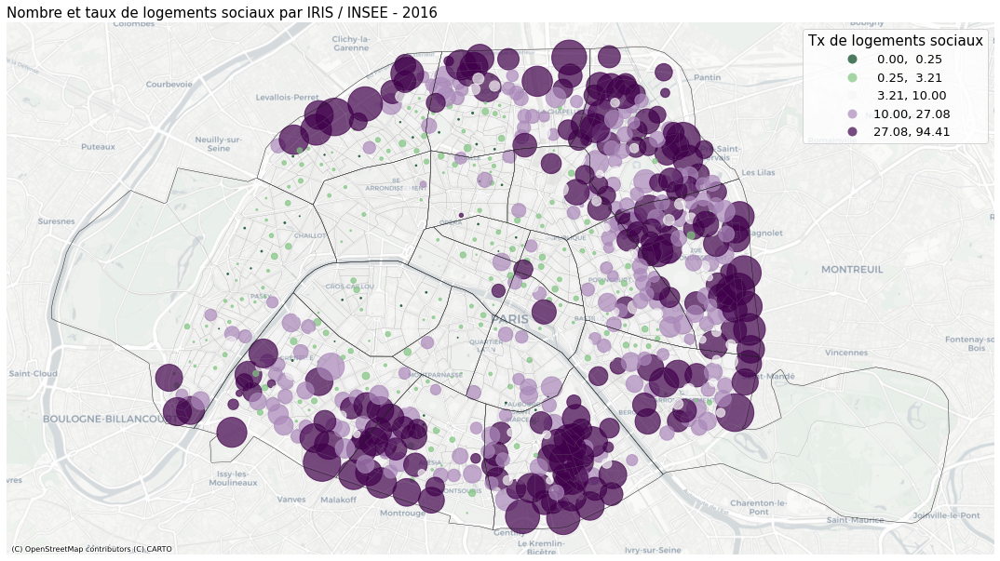

In [121]:
# Faire une carte du nombre de logements sociaux par IRIS


## Commencer par créer un geodataframe sous forme de points
IRIScentro = IRISPARIS.copy()
IRIScentro.geometry = IRIScentro['geometry'].centroid


## Faire la carte

Carte5, ax = plt.subplots(figsize=(19,19))
ARDT.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.4, color = 'black')
IRISPARIS.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.1, color = 'grey')
IRIScentro.to_crs('EPSG:3857').plot(ax=ax, markersize="nb_loc_social", alpha=0.7, column="Txlogsocial", cmap='PRGn_r',scheme='quantiles', categorical=False, 
                                    legend=True, legend_kwds={'title': "Tx de logements sociaux", 'loc': 'upper right', 'title_fontsize':15, 'fontsize':13})
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.title('Nombre et taux de logements sociaux par IRIS / INSEE - 2016', loc='left', fontsize=15)
plt.show()

# Exercices en autonomie

## Faire une planche avec deux cartes

Exemples : https://coderzcolumn.com/tutorials/data-science/plotting-static-maps-with-geopandas-working-with-geospatial-data#4


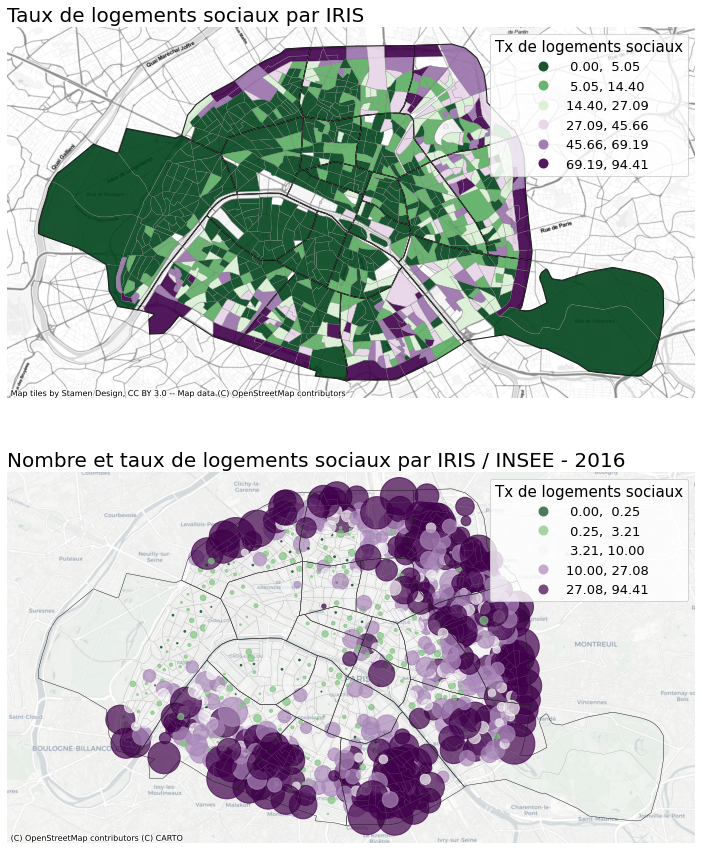



## Faire la carte du tx de locataire par IRIS

pct_prop = pourcentage de propriétaire


